# CS 163 Final Project: Image Super-Resolution using TorchSR

TorchSR can be found at https://github.com/Coloquinte/torchsr/.

In [1]:
import torch

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
if torch.cuda.is_available():
  print("Running on CUDA capable device.")
else:
  print("Running on CPU.")

! nvidia-smi

Running on CUDA capable device.
Fri Dec 13 17:09:50 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 551.61                 Driver Version: 551.61         CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                     TCC/WDDM  | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 4080      WDDM  |   00000000:01:00.0  On |                  N/A |
|  0%   33C    P8             10W /  420W |     590MiB /  16376MiB |      0%      Default |
|                                         |                        |                  N/A |
+---------------

# Quick Configuration

In [2]:
dataset_path = "./CS163_W24/MiniPlaces/data"

# The factor for input downscaling and model upscaling.
scale = 2 # Valid: 2, 4, 8. Recommended: 2

batch_size = 16 # Recommended: 16 (limit for 16GB GPU)
num_workers = 8 # Recommended: 8

# The model architecture to use for image super resolution.
arch = "RCAN" # Valid: "RCAN", "EDSR". Recommended: "RCAN"

# The evaluation metric to optimize for during finetuning.
loss_fn = "SSIM" # Valid: "SSIM", "PSNR". Recommended: "SSIM".

# MiniPlaces Data Preparation

In [3]:
import os
from tqdm import tqdm

# Recursively create directories if they do not exist.
os.makedirs(dataset_path, exist_ok=True)

The following cell downloads and extracts the MiniPlaces dataset. It only needs to be run once when using a local notebook, as the files will persist. Set run_setup = True when running this notebook for the first time, then run_setup = False thereafter to disable it.

This setup code has been adapted from UCLA CS 163 to run in a local environment (the original was designed to run on Google Colab).

In [4]:
run_setup = False # Only run once on a local notebook, files persist

if run_setup:
  # Download MiniPlaces dataset (tar.gz)
  import urllib.request
  name = 'data.tar.gz'
  url = 'https://web.cs.ucla.edu/~smo3/data.tar.gz'
  
  print(f'Downloading {name} from {url}')
  urllib.request.urlretrieve(url, f'{dataset_path}/{name}')

  # Extract downloaded MiniPlaces dataset
  import tarfile
  tar = tarfile.open("data.tar.gz", "r:gz")
  total_size = sum(f.size for f in tar.getmembers())
  with tqdm(total=total_size,
            unit="B",
            unit_scale=True,
            desc=f'Extracting {name}') as pbar:
    for member in tar.getmembers():
      # Extract to configured dataset path
      tar.extract(member, dataset_path)
      pbar.update(member.size)
  tar.close()
  os.remove(f'{dataset_path}/{name}') # Delete tar.gz after extraction

  # Download train/val/test text files:
  val_url = 'https://raw.githubusercontent.com/CSAILVision/miniplaces/master/data/val.txt'
  train_url = 'https://raw.githubusercontent.com/CSAILVision/miniplaces/master/data/train.txt'
  
  for name, url in {'train.txt': train_url, 'val.txt': val_url}.items():
    print(f'Downloading {name} from {url}')
    urllib.request.urlretrieve(url, f'{dataset_path}/{name}')

The MiniPlaces dataset contains images of size 128x128. We'll need to use the original 128x128 images as ground truths, so we'll need to downscale the training inputs.

In [5]:
# The MiniPlaces classes that define the datasets had to be moved to an
# external module to be able to run in a local environment.
from CS163_W24.MiniPlaces import *
from torchvision import transforms

# The base transform to apply to both the input and the ground truth
base_transform = transforms.ToTensor()

downscale = transforms.Resize(size=(128//scale, 128//scale))

# Create MiniPlaces Datasets
miniplaces_train = MiniPlacesSR(dataset_path, split='train',
                                base_transform=base_transform,
                                downscale=downscale)
miniplaces_valid = MiniPlacesSR(dataset_path, split='val',
                                base_transform=base_transform,
                                downscale=downscale)
miniplaces_test = MiniPlacesTest(dataset_path,
                                 transform=base_transform)

# Create Dataloaders for training and validation Datasets
from torch.utils.data import DataLoader

train_loader = DataLoader(miniplaces_train,
                          batch_size=batch_size,
                          num_workers=num_workers,
                          shuffle=True)
valid_loader = DataLoader(miniplaces_valid,
                          batch_size=batch_size,
                          num_workers=num_workers,
                          shuffle=False)

### Helper Function for Output Display

In [6]:
from torchvision.transforms.functional import to_pil_image, to_tensor
import matplotlib.pyplot as plt

def display_images(mode, dataset, figsize, rows, cols, cols_per_image,
                   model=None, epoch=None, ft_model=None):
  figure = plt.figure(figsize=figsize) # Display images together in a figure
  for i in range(rows * cols // cols_per_image): # Number of images
    lr, hr = dataset[i] # Get an image, add the low-res input to the figure
    images, titles = [to_pil_image(lr)], ["Image " + str(i + 1) + " (Input)"]

    if (mode == "train"): # Visualizing training data, no model involved
      images.append(to_pil_image(hr)) # Add the high-res original to the figure
      titles.append("Image " + str(i + 1) + " (Original)")

    else: # val, test, or test-ft mode, model(s) supplied in parameters
      sr = model(lr.to(device)) # Run model on low-res input
      sr_img = to_pil_image(sr.squeeze(0).clamp(0, 1)) # Convert Tensor to PIL
      # squeeze(0) removes dim 0 if 1 (e.g., [1,3,512,512] to [3,512,512])
      # clamp(0, 1) clamps Tensor elements to valid PIL color values.
      images.append(sr_img) # Add the super-resolution output to the figure
      titles.append("Image " + str(i + 1) + " (" + str(scale) + "x SR)")

      if (mode == "val"): # Add eval info and high-res original to the figure
        figure.suptitle("Epoch " + str(epoch) + " Validation", fontsize=16)
        images.append(to_pil_image(hr))
        titles.append("Image " + str(i + 1) + " (Original)")
        # Calculate evaluation metrics for the individual samples
        hr = hr.to(device)
        psnr = getPSNR(sr, hr)
        ssim = getSSIM(sr.unsqueeze(0), hr.unsqueeze(0).to(device))
        titles[1] += f' | PSNR: {psnr:.1f} | SSIM: {ssim:.3f}' # Add to SR title

      elif (mode == "test-ft"): # add finetuned model SR output to the figure
        ft_sr = ft_model(lr.to(device)) # Run finetuned model
        images.append(to_pil_image(ft_sr.squeeze(0).clamp(0, 1)))
        titles.append("Image " + str(i + 1) + " (" + str(scale) + "x Fine-tuned SR)")

    for j in range(len(images)): # Display the images prepared above
      figure.add_subplot(rows, cols, cols_per_image * i + j + 1)
      plt.imshow(images[j])
      plt.title(titles[j])
      
  plt.show()

# Testing Pretrained RCAN x2 with MiniPlaces

First, let's use the pre-trained RCAN model to visualize x2 upscaling from 128x128 to 256x256. I've chosen x2 scale factor for MiniPlaces because we will later finetune by training x2 upscaling from 64x64 to 128x128. x4 upscaling would require 32x32 input size, which loses too many details to produce good results. I've chosen RCAN over EDSR because they performed almost identically, but RCAN trained faster.

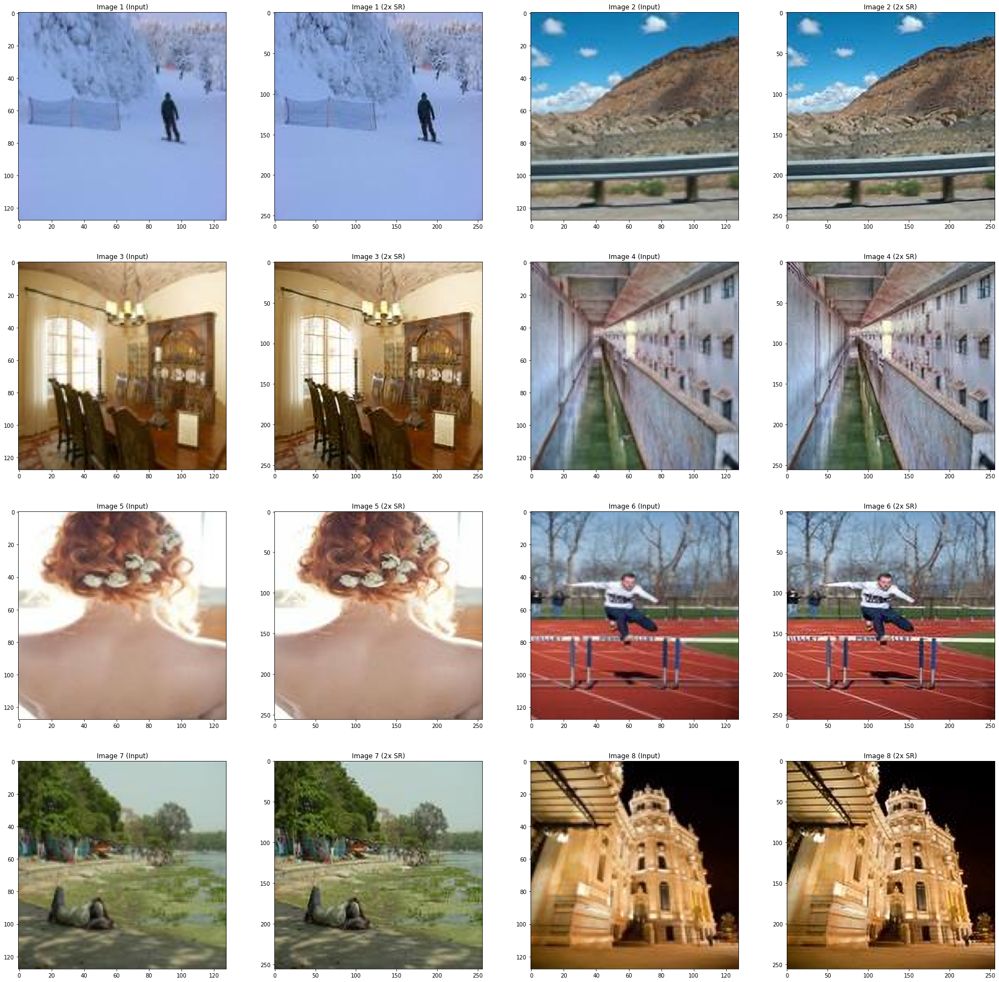

In [7]:
model = None
if (arch == "RCAN"):
  from torchsr.models import rcan
  # Download pretrained RCAN and send it to the CUDA device
  model = rcan(scale=scale, pretrained=True).to(device)
elif (arch == "EDSR"):
  from torchsr.models import edsr
  # Download pretrained EDSR and send it to the CUDA device
  model = edsr(scale=scale, pretrained=True).to(device)

display_images(mode="test", dataset=miniplaces_test, figsize=(32, 32), rows=4, cols=4, cols_per_image=2, model=model)

# Fine-Tuning RCAN on MiniPlaces

Now, we'll finetune RCAN x2 using our 64x64 to 128x128 dataset and see if there is an improvement when upscaling 128x128 to 256x256. Let's visualize the downscaled versions of the training images.

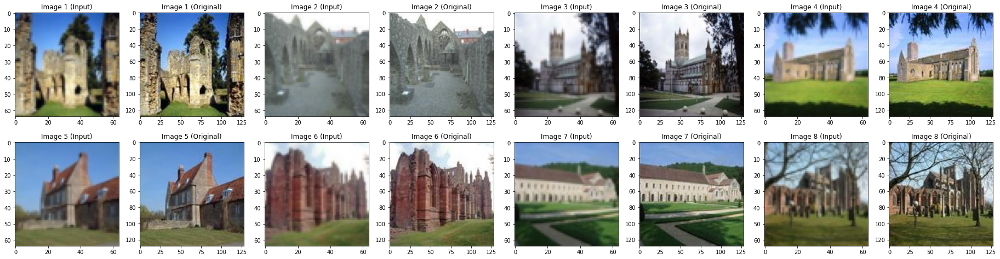

In [8]:
display_images(mode="train", dataset=miniplaces_train, figsize=(32, 8), rows=2, cols=8, cols_per_image=2)

### PSNR and SSIM as Loss Functions

PSNR (Peak Signal-to-Noise Ratio) and SSIM (Structural Similarity Index Measure) are image quality metrics that we will use to evaluate our super resolution results.

In [9]:
def getPSNR(input: torch.Tensor, target: torch.Tensor) -> torch.Tensor:
  mse = torch.nn.functional.mse_loss(input, target)
  psnr = 10 * torch.log10(1 / mse) # Peak signal = 1
  return psnr

class PSNRLoss(torch.nn.Module): # Wrap getPSNR as a loss function
  def __init__(self) -> None:
    super().__init__()

  def forward(self, input: torch.Tensor, target: torch.Tensor) -> torch.Tensor:
    psnr = getPSNR(input, target)
    return -psnr # Maximize PSNR by minimizing -PSNR

from torchmetrics.image import StructuralSimilarityIndexMeasure
getSSIM = StructuralSimilarityIndexMeasure().to(device)

class SSIMLoss(torch.nn.Module): # Wrap getSSIM as a loss function
  def __init__(self) -> None:
    super().__init__()

  def forward(self, input: torch.Tensor, target: torch.Tensor) -> torch.Tensor:
    ssim = getSSIM(input, target)
    return 1 - ssim # Maximize SSIM by minimizing 1 - SSIM

### Train and Evaluate Functions

This is not a classification problem, so instead of class labels we are evaluating loss of the super resolution image against the original image. The evaluate function now provides visual output so we can inspect the progress of the model as it trains.

In [10]:
def train(model, train_loader, val_loader, optimizer, criterion, device,
          num_epochs, epochs_per_eval, val_set):
  """
  Args:
    model: The model to train.
    train_loader (torch.utils.data.DataLoader): DataLoader for training set.
    val_loader (torch.utils.data.DataLoader): DataLoader for validation set.
    optimizer (torch.optim.Optimizer): Optimizer to use for training.
    criterion (callable): Loss function to use for training.
    device (torch.device): Device to use for training.
    num_epochs (int): Number of epochs to train the model.
    epochs_per_eval (int): Epochs to wait before each call to evaluate().
    val_set (CS163_W24.MiniPlaces.MiniPlacesSR): MiniplacesSR dataset for
                                                 validation set.
  """
  model = model.to(device)
  evaluate(model, val_loader, 0, device, val_set) # Evaluate before training

  for epoch in range(1, num_epochs + 1):
    model.train()  # Set model to training mode
    # Use tqdm to display a progress bar during training
    with tqdm(total=len(train_loader),
              desc=f'Epoch {epoch}/{num_epochs}',
              position=0,
              leave=True) as pbar:
      for inputs, ground_truths in train_loader:
        inputs = inputs.to(device)
        ground_truths = ground_truths.to(device)

        optimizer.zero_grad() # Zero out gradients

        # Compute the super resolution image and loss
        sr = model(inputs).clamp(0, 1)
        # clamp(0, 1) clamps Tensor elements to valid PIL color values.
        loss = criterion(sr, ground_truths)

        loss.backward() # Backpropagate the loss
        optimizer.step() # Update the weights

        pbar.update(1) # Update the progress bar
        pbar.set_postfix(loss=loss.item())

    # Evaluate the model on the validation set
    if ((epoch % epochs_per_eval) == 0 and (epoch < num_epochs)):
      evaluate(model, val_loader, epoch, device, val_set)

  evaluate(model, val_loader, num_epochs, device, val_set) # Evaluate after training

def evaluate(model, val_loader, epoch, device, val_set):
  """
  Args:
    model: The model to evaluate.
    val_loader (torch.utils.data.DataLoader): DataLoader for validation set.
    device (torch.device): Device to use for training.
    epoch (int): The epoch number that evaluate() is being called on.
    val_set (CS163_W24.MiniPlaces.MiniPlacesSR): MiniplacesSR dataset for
                                                 the validation set.
  """
  model.eval()  # Set model to evaluation mode
  with torch.no_grad():
    total_psnr, total_ssim = 0.0, 0.0

    for inputs, ground_truths in val_loader:
      # Move inputs and labels to device
      inputs = inputs.to(device)
      ground_truths = ground_truths.to(device)

      # Compute the super resolution image and score (PSNR or SSIM)
      sr = model(inputs).clamp(0, 1)
      # clamp(0, 1) clamps Tensor elements to valid PIL color values.
      total_psnr += getPSNR(sr, ground_truths).item()
      total_ssim += getSSIM(sr, ground_truths).item()

  # Print evaluation metrics and display images in validation mode
  print(f'Average PSNR: {total_psnr / len(val_loader):.2f} | Average SSIM: {total_ssim / len(val_loader):.4f}')
  display_images(mode="val", dataset=val_set, figsize=(20, 10), rows=2, cols=3, cols_per_image=3, model=model, epoch=epoch)

### Training

Average PSNR: 27.96 | Average SSIM: 0.8921


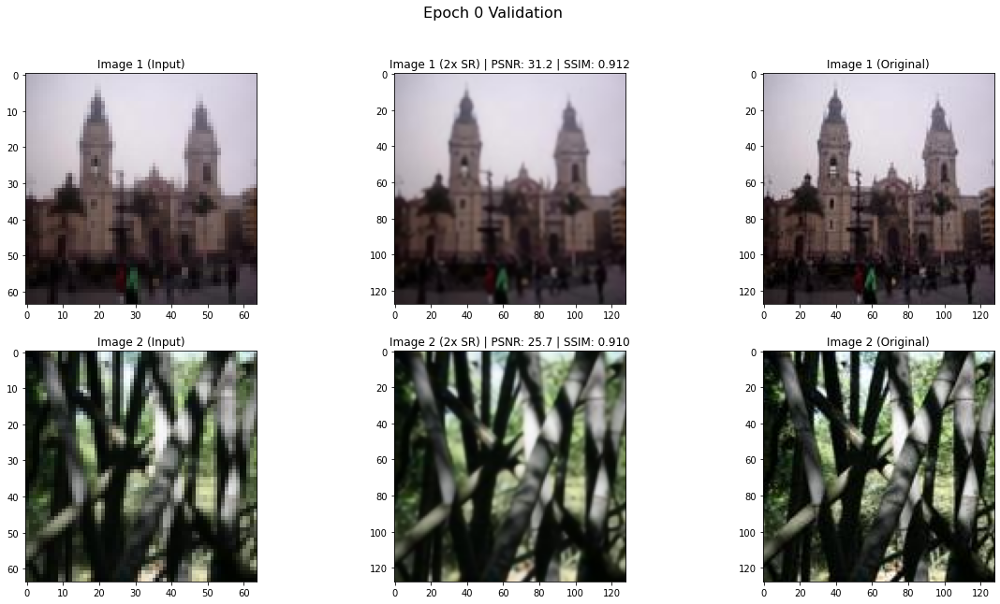

Epoch 1/1: 100%|████████████████████████████████████████████| 6250/6250 [28:24<00:00,  3.67it/s, loss=0.0713]


Average PSNR: 29.14 | Average SSIM: 0.9233


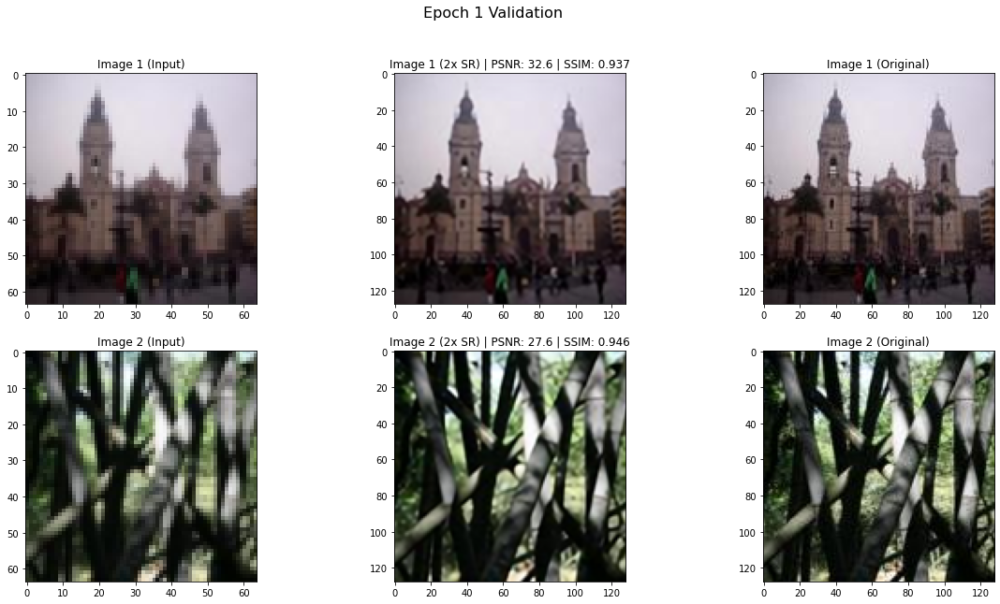

In [11]:
from torchsr.models import rcan

ft_model = None
upsampler_param_index = -6 # RCAN upsample module params at param_list[-6:-2]
if (arch == "RCAN"):
  ft_model = rcan(scale=scale, pretrained=True).to(device)
elif (arch == "EDSR"):
  ft_model = edsr(scale=scale, pretrained=True).to(device)
  upsampler_param_index = -4 # EDSR upsample module params at param_list[-4:-2]

param_list = list(ft_model.parameters()) # Extract params to split them
'''
# Uncomment this block to print model parameters to determine param groups.
for i, n in enumerate([name for name, _ in ft_model.named_parameters()]):
  print(str(i) + ": " + n, end=" ")
print('\n' + str(ft_model.tail))
'''
body = {
  'lr': 0, # Freeze pretrained body
  'params': param_list[:upsampler_param_index] # Parameters before upsampler
}
upsampler = {
  'lr': 1e-4, # Finetune upsampler module
  'params': param_list[upsampler_param_index:-2] # Upsample module parameters
}
reconstruction = {
  'lr': 0, # Freeze pretrained reconstruction module
  'params': param_list[-2:] # Reconstruction module parameters
}

# Initialize optimizer with our custom param groups
optimizer = torch.optim.Adam([body, upsampler, reconstruction])
criterion = None
if (loss_fn == "SSIM"):
  criterion = SSIMLoss()
elif (loss_fn == "PSNR"):
  criterion = PSNRLoss()

# Train the model
train(ft_model, train_loader, valid_loader, optimizer, criterion, device,
      num_epochs=1, epochs_per_eval=1, val_set=miniplaces_valid)

# Final Results

The results produced by our midterm implementation.

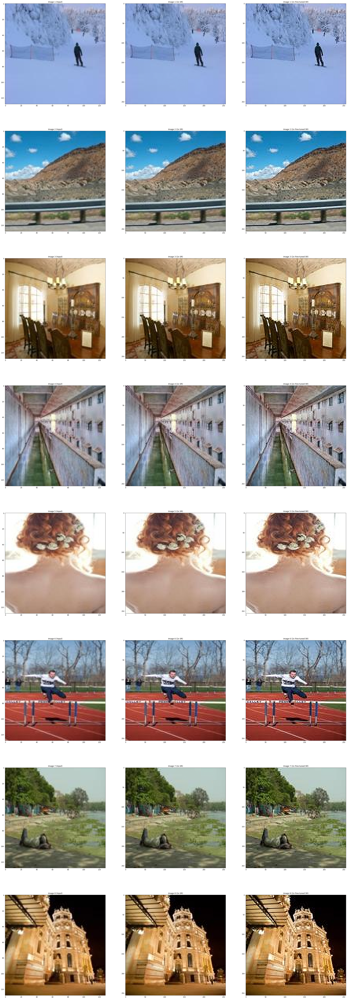

In [12]:
display_images(mode="test-ft", dataset=miniplaces_test, figsize=(40, 120), rows=8, cols=3, cols_per_image=3, model=model, ft_model=ft_model)